<a href="https://colab.research.google.com/github/gal-dmitry/HSE_CV/blob/main/homework_4_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##  Домашнее задание № 4: Better call Elon.

Задание присылать на обе почты почты aleksartamonov@gmail.com dashkov.alexander.om@gmail.com в виде ссылки на colab

В теме письма указать **CV_HSE_2021 HW4 <Фамилия Имя>**

soft deadline: 14.05.2021T23:59:00+0300

hard deadline: 21.05.2021T23:59:00+0300


Вы решили создать свою Self-Driving-Cars компанию.

Одной из самых главных задач в данном случае  -- это определять, что находится вокруг машины. Для этого необходимо применить методы компьютерного зрения, а именно решить задачу Object Detection. 

Измерьте качество определения объектов по датасету:

https://bdd-data.berkeley.edu/

с помощью двух алгоритмов и сравните их качество.

In [ ]:
import os
import numpy as np
import cv2 as cv2
from PIL import Image
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
import random
from scipy import ndimage
import json
import sys

In [ ]:
import torch
import torchvision
import torchvision.transforms as T

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


***1. (10 баллов)*** 

***Работа с алгоритмами***: Примените оба алгоритма:

* одна из версий YOLO
* Faster R-CNN(любой, который будет удобен Вам в использовании)

и выведете результаты детекции для первых 20 изображений. 

В качестве ответа на это задание ожидается:

* код с помощью которого осуществляется само детектирование или код обращения к фреймворкам для детектирования;
* 20 изображений в ноутбуке, на которых в произвели детекцию;

### DATASET

In [ ]:
!unzip berk_kaggle.zip

Archive:  berk_kaggle.zip
   creating: berk_kaggle/
  inflating: berk_kaggle/b87ca2c5-c3c19d35.jpg  
  inflating: berk_kaggle/b13c3bff-c406a89e.jpg  
  inflating: berk_kaggle/b1205d47-0b5efb64.jpg  
  inflating: berk_kaggle/b1441884-7587e0f5.jpg  
  inflating: berk_kaggle/b912099e-00000000.jpg  
  inflating: berk_kaggle/b855a117-70a18bd4.jpg  
  inflating: berk_kaggle/b1455b0a-f8c10efc.jpg  
  inflating: berk_kaggle/b1455b0a-f8c11637.jpg  
  inflating: berk_kaggle/b187a91a-4203b1fa.jpg  
  inflating: berk_kaggle/b16a27ef-00000000.jpg  
  inflating: berk_kaggle/b168df58-00000000.jpg  
  inflating: berk_kaggle/b1926625-00000000.jpg  
  inflating: berk_kaggle/b19d350d-e452b8de.jpg  
  inflating: berk_kaggle/b82f91d7-bfdd8751.jpg  
  inflating: berk_kaggle/b873c993-34497d58.jpg  
  inflating: berk_kaggle/b8a89f39-00000000.jpg  
  inflating: berk_kaggle/b909df8f-51c574bb.jpg  
  inflating: berk_kaggle/b8c18808-00000000.jpg  
  inflating: berk_kaggle/b8b0554a-ecca297f.jpg  
  inflating: berk

In [ ]:
!ls berk_kaggle 

b1205d47-0b5efb64.jpg  b187a91a-4203b1fa.jpg  b8a89f39-00000000.jpg
b13c3bff-c406a89e.jpg  b1926625-00000000.jpg  b8b0554a-ecca297f.jpg
b1441884-7587e0f5.jpg  b19d350d-e452b8de.jpg  b8c18808-00000000.jpg
b1455b0a-f8c10efc.jpg  b82f91d7-bfdd8751.jpg  b8d397a1-00000000.jpg
b1455b0a-f8c11637.jpg  b855a117-70a18bd4.jpg  b909df8f-51c574bb.jpg
b168df58-00000000.jpg  b873c993-34497d58.jpg  b912099e-00000000.jpg
b16a27ef-00000000.jpg  b87ca2c5-c3c19d35.jpg


In [ ]:
!pwd

/content


### Faster R-CNN

In [ ]:
torch.__version__

'1.8.1+cu101'

In [ ]:
torchvision.__version__

'0.9.1+cu101'

In [ ]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True) 

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


In [ ]:
model.eval()

In [ ]:
COCO_INSTANCE_CATEGORY_NAMES = ['__background__', 'person', 'bicycle', 'car', 'motorcycle', 
                                'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 
                                'fire hydrant', 'N/A', 'stop sign', 'parking meter', 'bench', 
                                'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 
                                'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 
                                'umbrella', 'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 
                                'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 
                                'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 
                                'tennis racket', 'bottle', 'N/A', 'wine glass', 'cup', 'fork', 
                                'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 
                                'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 
                                'cake', 'chair', 'couch', 'potted plant', 'bed', 
                                'N/A', 'dining table', 'N/A', 'N/A', 'toilet', 'N/A', 'tv', 
                                'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 
                                'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 
                                'N/A', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 
                                'hair drier', 'toothbrush']

In [ ]:
len(COCO_INSTANCE_CATEGORY_NAMES)

91

In [ ]:
colors = [(random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)) for i in range(91)]
dct = {i:j for i, j in zip(COCO_INSTANCE_CATEGORY_NAMES, range(91))}

In [ ]:
colors

In [ ]:
def get_prediction(img_path, threshold):

  transform = T.Compose([T.ToTensor()])
  img = Image.open(img_path)
  img = transform(img)

  pred = model([img])
  pred_class = [COCO_INSTANCE_CATEGORY_NAMES[i] for i in list(pred[0]['labels'].numpy())]
  pred_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(pred[0]['boxes'].detach().numpy())]
  pred_score = list(pred[0]['scores'].detach().numpy())
  pred_t = [pred_score.index(x) for x in pred_score if x > threshold][-1]

  pred_boxes = pred_boxes[:pred_t+1]
  pred_class = pred_class[:pred_t+1]

  return pred_boxes, pred_class

In [ ]:
def object_detection_api(img_path, threshold=0.5, rect_th=3, text_size=1.5, text_th=3):
    boxes, pred_cls = get_prediction(img_path, threshold)

    img = cv2.imread(img_path) 
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  

    for i in range(len(boxes)):
        indx = dct[pred_cls[i]]
        cv2.rectangle(img, boxes[i][0], boxes[i][1], color=colors[indx], thickness=rect_th)
        cv2.putText(img, pred_cls[i], boxes[i][0], cv2.FONT_HERSHEY_SIMPLEX, text_size, colors[indx], thickness=text_th) 

    plt.figure(figsize=(20,30)) 
    plt.imshow(img), plt.xticks([]), plt.yticks([]), plt.show()

In [ ]:
!pwd

/content


In [ ]:
files = os.listdir(path='berk_kaggle')
files

['b1455b0a-f8c10efc.jpg',
 'b16a27ef-00000000.jpg',
 'b8b0554a-ecca297f.jpg',
 'b909df8f-51c574bb.jpg',
 'b873c993-34497d58.jpg',
 'b187a91a-4203b1fa.jpg',
 'b1926625-00000000.jpg',
 'b13c3bff-c406a89e.jpg',
 'b1455b0a-f8c11637.jpg',
 'b8a89f39-00000000.jpg',
 'b1441884-7587e0f5.jpg',
 'b8d397a1-00000000.jpg',
 'b19d350d-e452b8de.jpg',
 'b1205d47-0b5efb64.jpg',
 'b87ca2c5-c3c19d35.jpg',
 'b855a117-70a18bd4.jpg',
 'b8c18808-00000000.jpg',
 'b912099e-00000000.jpg',
 'b82f91d7-bfdd8751.jpg',
 'b168df58-00000000.jpg']

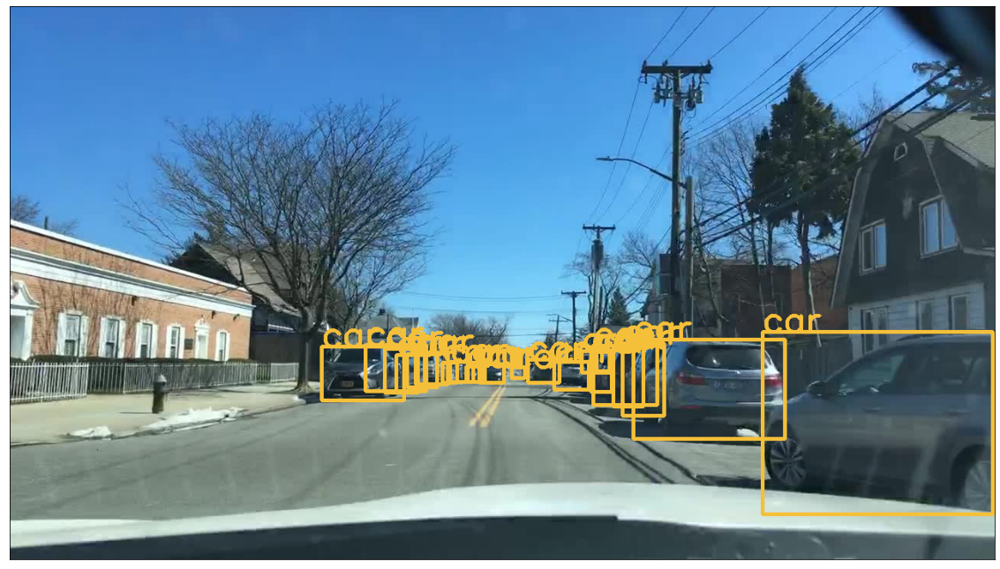

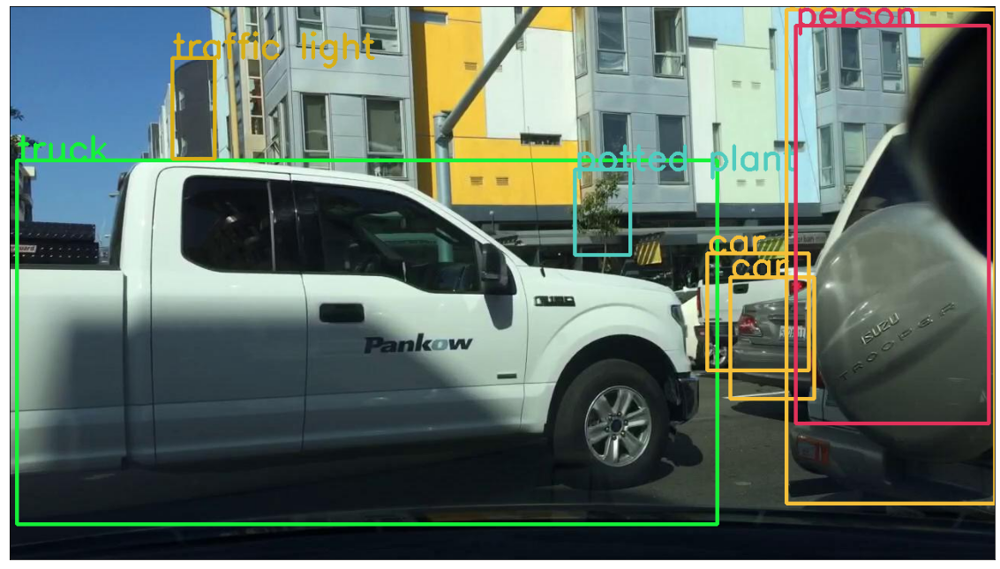

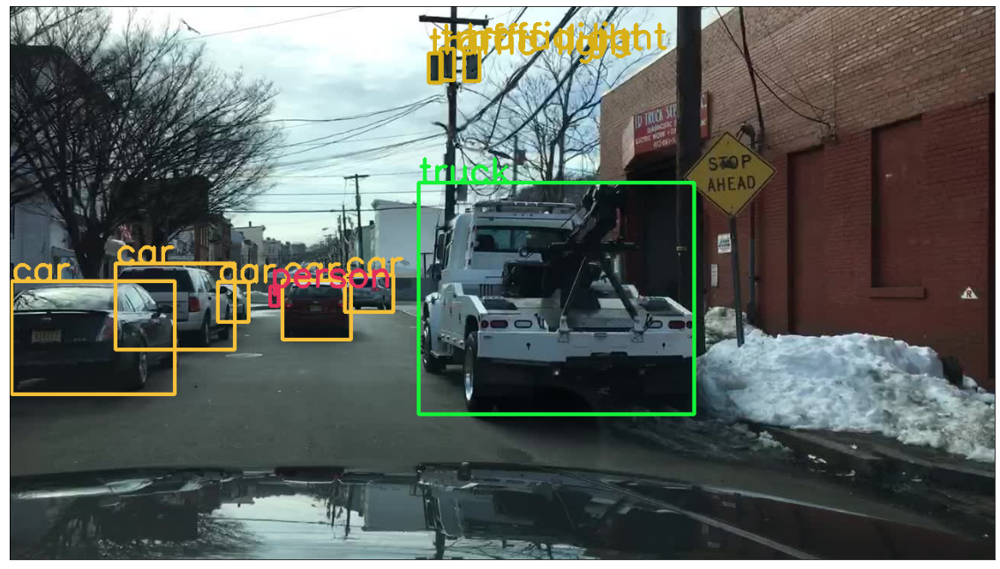

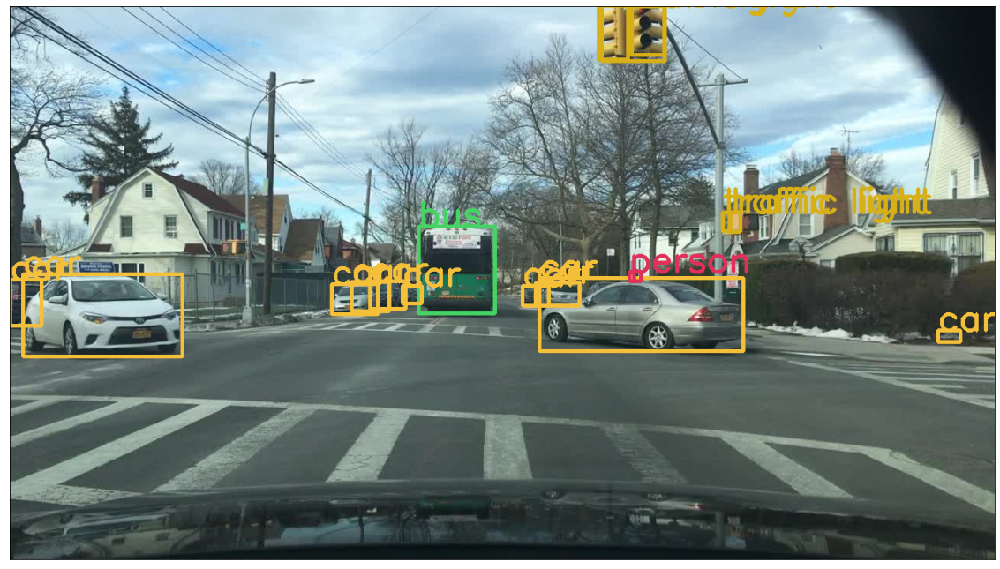

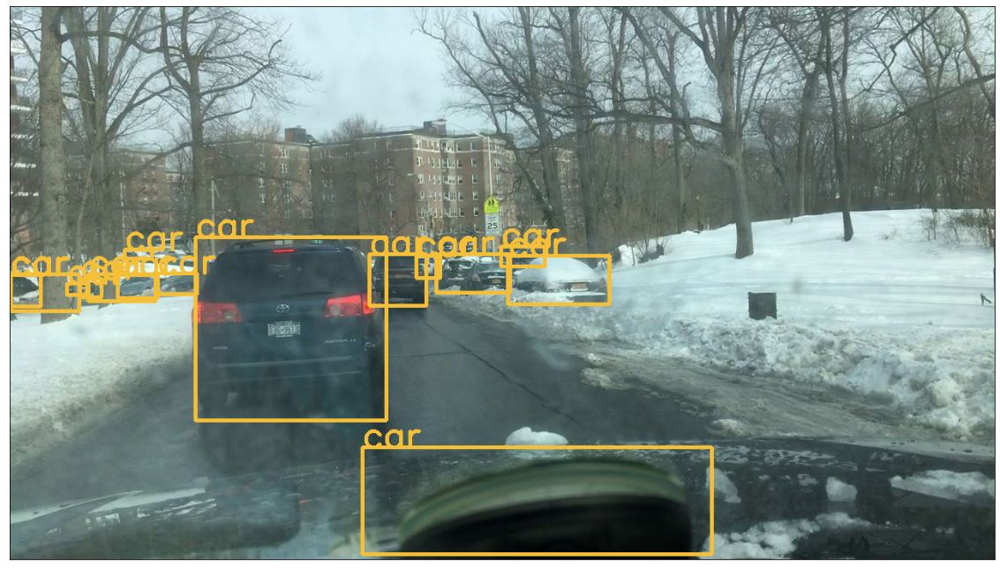

...

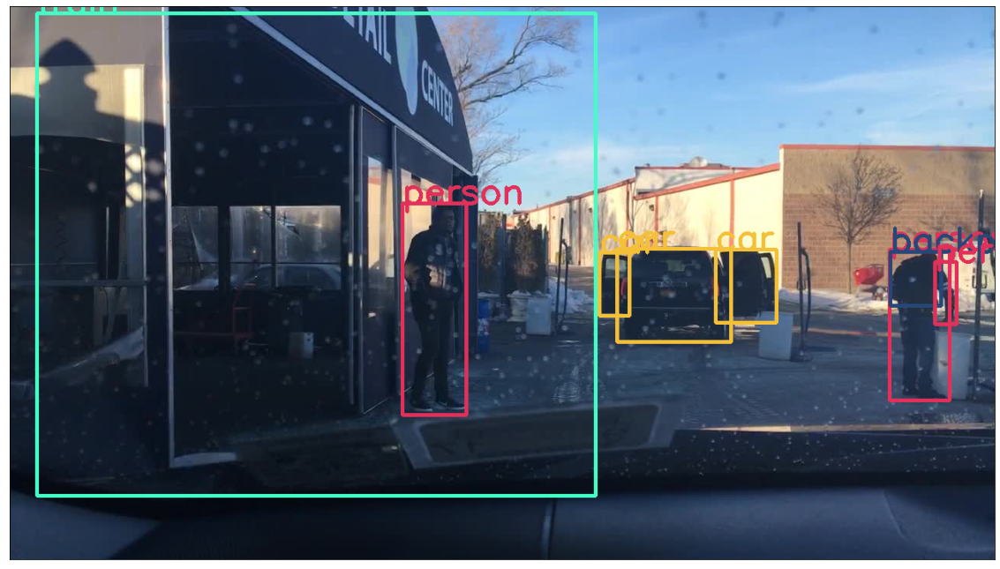

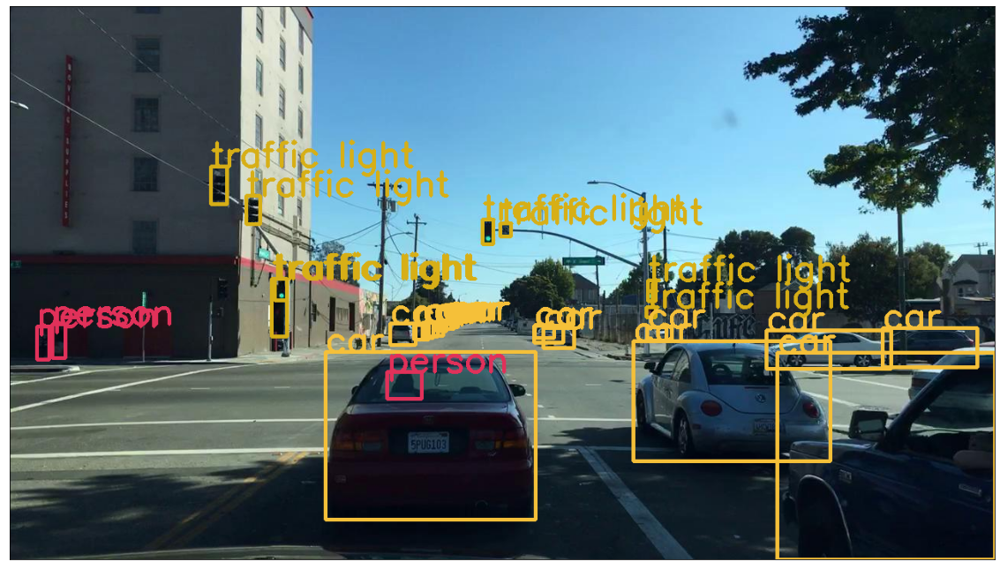

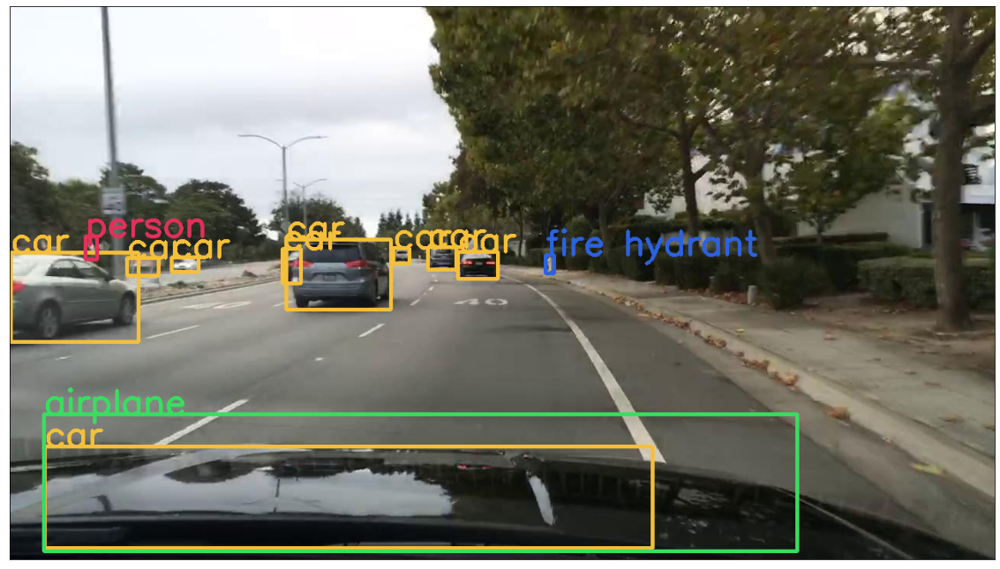

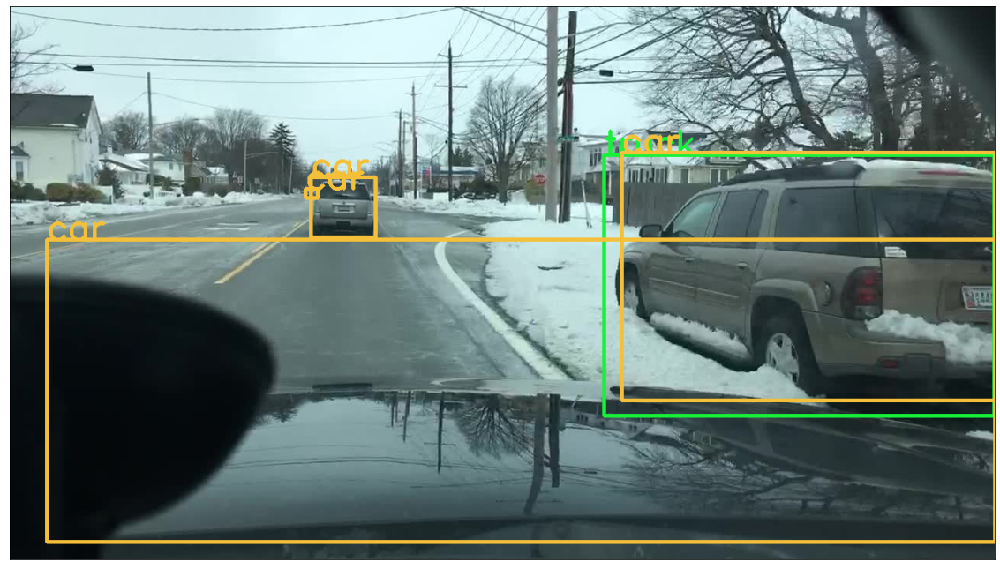

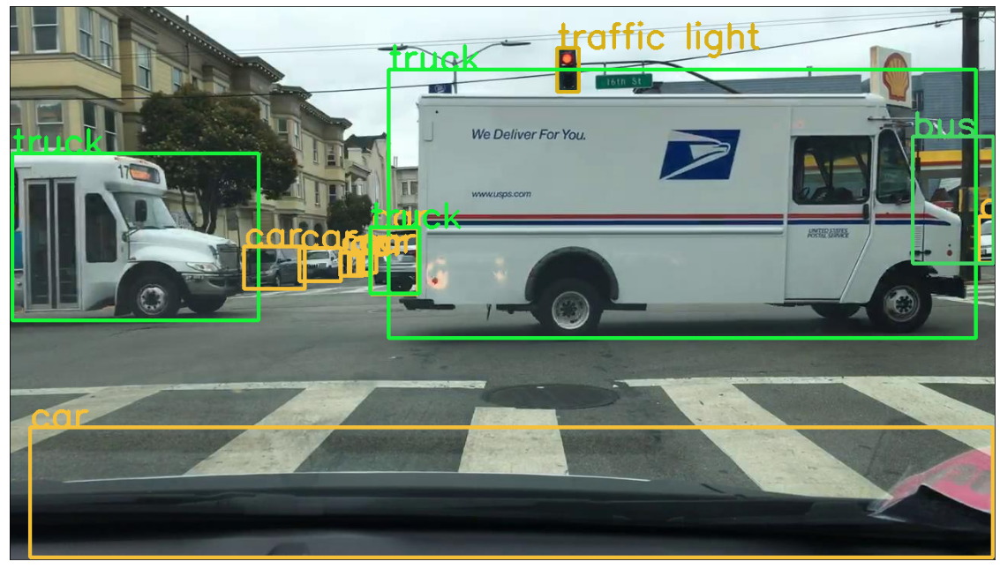

In [ ]:
dir = 'berk_kaggle/'
for img in files:
    full_path = dir + img
    object_detection_api(full_path, threshold=0.5)

---

### YOLO

[official YOLOv3](https://pjreddie.com/darknet/yolo/)

In [ ]:
!pwd

/content


In [ ]:
!git clone https://github.com/pjreddie/darknet

Cloning into 'darknet'...
remote: Enumerating objects: 5934, done.
remote: Total 5934 (delta 0), reused 0 (delta 0), pack-reused 5934
Receiving objects: 100% (5934/5934), 6.35 MiB | 11.15 MiB/s, done.
Resolving deltas: 100% (3925/3925), done.


In [ ]:
%cd darknet
!make

/content/darknet
mkdir -p obj
mkdir -p backup
mkdir -p results
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/gemm.c -o obj/gemm.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/utils.c -o obj/utils.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/cuda.c -o obj/cuda.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/deconvolutional_layer.c -o obj/deconvolutional_layer.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/convolutional_layer.c -o obj/convolutional_layer.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/list.c -o obj/list.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/image.c -o

In [ ]:
!wget https://pjreddie.com/media/files/yolov3.weights

--2021-05-10 14:26:17--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M  21.1MB/s    in 12s     

2021-05-10 14:26:30 (19.7 MB/s) - ‘yolov3.weights’ saved [248007048/248007048]



In [ ]:
%cd darknet

/content/darknet


In [ ]:
files

['b1455b0a-f8c10efc.jpg',
 'b16a27ef-00000000.jpg',
 'b8b0554a-ecca297f.jpg',
 'b909df8f-51c574bb.jpg',
 'b873c993-34497d58.jpg',
 'b187a91a-4203b1fa.jpg',
 'b1926625-00000000.jpg',
 'b13c3bff-c406a89e.jpg',
 'b1455b0a-f8c11637.jpg',
 'b8a89f39-00000000.jpg',
 'b1441884-7587e0f5.jpg',
 'b8d397a1-00000000.jpg',
 'b19d350d-e452b8de.jpg',
 'b1205d47-0b5efb64.jpg',
 'b87ca2c5-c3c19d35.jpg',
 'b855a117-70a18bd4.jpg',
 'b8c18808-00000000.jpg',
 'b912099e-00000000.jpg',
 'b82f91d7-bfdd8751.jpg',
 'b168df58-00000000.jpg']

In [ ]:
!mkdir ./20pics

In [ ]:
for i, var in enumerate(files):
    var = "../berk_kaggle/" + var
    %sx ./darknet detect cfg/yolov3.cfg yolov3.weights {var}
    img = Image.open("predictions.jpg")
    img.save("./20pics/" + str(i) + ".jpg", "JPEG")

In [ ]:
!pwd

/content/darknet


In [1]:
# for i in range(20):
#     img = Image.open("20pics/" + str(i) + ".jpg").convert("RGB")
#     img.show()

---


***2. (10 баллов)***  Проведите сравнение двух рассмотренных алгоритмов с помощью метрик:

В качестве метрик сравнений предлагаются: 

* Detection Rate;
* mAP; 

все метрики для IoU > 0.5

В качестве справки: https://pdfs.semanticscholar.org/d051/ba0a904e4b4c45a2af145aa29b8490bbbc5c.pdf


### **Описание**

**1. Классы**

Чтобы получить правильные показатели, нейросети необходимо сравнивать только на объектах тех классов, на которых они были натренированны. Поэтому итоговое множество классов является пересечением:

- множества классов, присутствующих в датасете
- множества классов, на которых была натренирована YOLO
- множества классов, на которых была натренирована RCNN

**2. Алгоритм оценивания**

Для рассчета mAP используется [данный фреймворк](https://github.com/rafaelpadilla/Object-Detection-Metrics). Он подразумевает следующий формат данных:

- GroundTruth:

Список файлов ```.txt```, имеющих названия, соответсвующие названиям картинок. Каждый из файлов содержит столько строк, сколько объектов на картинке.
Каждая строка имеет следующий формат:

```class_id x1 x2 x3 x4```


- Detections:

Список файлов ```.txt```, имеющих названия, соответсвующие названиям картинок. Каждый из файлов содержит столько строк, сколько объектов задетектировала нейросеть на картинке.
Каждая строка имеет следующий формат:

```class_id confidence x1 x2 x3 x4```

$ $

Вывод нейросетей YOLO и RCNN, а также groundtruth-лейблы для датасета Berkel необходимо привести к формату, описанному выше.

Оценка производилась для 120 изображений из датасета

```
Алгоритм:

1. Создать папку со 100 картинками из датасета
2. Подгрузить леблы
3. Проверить, что имена и порядок картинок и их лейблов совпадают

3. Сделать пересечение 3-х множеств лейблов
4. Сделать словарь отображающий лейблы в id
5. Создать код, переводящий данные ground_truth-лейблов из json в необходимый формат

5. Сделать клон репозитория YOLOv3
6. Произвести детекцию и сохранить картинки и лейблы в папку на Drive
7. Создать код, переводящий леблы в необходимый формат

8. Подгрузить Faster-RCNN из torch
9. Создать код, сохраняющий предсказания в необходимом формате в папку на Drive

9. Сделать клон репозитория Obj-Det-Metrics
10. Сделать оценку для YOLOv3
11. Сделать оценку для FasterRCNN
```

### 100 pictures from Berkeley Dataset

In [ ]:
%cd /content

/content


In [ ]:
!pwd

/content


In [ ]:
PATH = '/content/drive/MyDrive/HSE/LOCAL_FOLDERS/CV/hw_4_local/berkley/'
PATH_TO_ZIP = PATH + 'val.zip'
PATH_TO_NEW_FOLDER = PATH + 'val'
PATH_TO_PICTURES = PATH_TO_NEW_FOLDER + '/100_pictures'
PATH_TO_GROUND_TRUTH = PATH_TO_NEW_FOLDER + '/Ground_truth_labels'
# !unzip {PATH_TO_ZIP} -d {PATH_TO_NEW_FOLDER}

### Json and pictures

In [ ]:
def check_pictures_and_json():
    all_pictures_list = sorted(os.listdir(path=PATH_TO_PICTURES))

    json_info = []
    with open(f'{PATH}labels.json') as json_file:
        json_ = json.load(json_file) ###!
        json_info = sorted([i for i in json_ if i['name'] in all_pictures_list], key=lambda x: x['name'])

    if len(all_pictures_list) != len(json_info):
        print(len(all_pictures_list))
        print(len(json_info))
        raise ValueError("count doesn't match!")

    picture_names_in_json_info = []
    for picture in json_info:
        picture_names_in_json_info.append(picture['name'])
    
    if all_pictures_list != picture_names_in_json_info:
        raise ValueError("name doesn't match!")

    print('count of pictures and labels:', len(json_info))
    return all_pictures_list, json_info, picture_names_in_json_info

In [ ]:
all_pictures_list, json_info, picture_names_in_json_info = check_pictures_and_json()

count of pictures and labels: 120


### Unique labels

In [ ]:
YOLOv3_labels =  [ 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light',
         'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
         'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee',
         'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard',
         'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
         'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch',
         'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
         'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear',
         'hair drier', 'toothbrush' ]

In [ ]:
COCO_INSTANCE_CATEGORY_NAMES = ['__background__', 'person', 'bicycle', 'car', 'motorcycle', 
                                'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 
                                'fire hydrant', 'N/A', 'stop sign', 'parking meter', 'bench', 
                                'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 
                                'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 
                                'umbrella', 'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 
                                'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 
                                'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 
                                'tennis racket', 'bottle', 'N/A', 'wine glass', 'cup', 'fork', 
                                'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 
                                'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 
                                'cake', 'chair', 'couch', 'potted plant', 'bed', 
                                'N/A', 'dining table', 'N/A', 'N/A', 'toilet', 'N/A', 'tv', 
                                'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 
                                'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 
                                'N/A', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 
                                'hair drier', 'toothbrush']

In [ ]:
def get_unique_labels(json_info):
    unique_labels = set()
    for picture in json_info:
        for detected_obj in picture['labels']:   
            unique_labels.add(detected_obj['category'])

    YOLOv3_set = set(YOLOv3_labels)
    COCO_set = set(COCO_INSTANCE_CATEGORY_NAMES)
    all_classes = YOLOv3_set & COCO_set & unique_labels

    id_list = {j:i for i, j in enumerate(all_classes)}

    print(all_classes)
    print(id_list)
    return all_classes, id_list

In [ ]:
 all_classes, id_list = get_unique_labels(json_info)

{'car', 'truck', 'person', 'bus', 'traffic light'}
{'car': 0, 'truck': 1, 'person': 2, 'bus': 3, 'traffic light': 4}


```
all_pictures_list - название первых 100 картинок из датасета
json_info - информация о первых 100 картинках из json-файла

unique_labels - все классы, встречающиеся в первых 100 картинках датасета
YOLOv3_labels - лейблы из датасета, на котором тренировали YOLOv3_labels
COCO_INSTANCE_CATEGORY_NAMES - лейблы из датасета, на котором тренировали Faster RCNN

all_classes - лейблы, на которых будет производиться сравнение метрик !
              (пересечение unique_labels, 
              COCO_INSTANCE_CATEGORY_NAMES,
              YOLOv3_labels)

id_list - словарь, отображающий all_classes в уникальные id
```

### Ground_truth labels

#### write txt

In [ ]:
def write_ground_truth_txt():
    for picture in json_info:
        name = picture['name'][:-4]
        with open (f'{PATH_TO_GROUND_TRUTH}/labels/{name}.txt', 'w') as file:
            for detected_obj in picture['labels']:
                if 'box2d' in detected_obj.keys():
                    category = detected_obj['category']
                    if category in all_classes: ###!!!
                        category_id = id_list[category]
                        coordinates = detected_obj['box2d']
                        x1 = int(coordinates['x1'])
                        y1 = int(coordinates['y1'])
                        x2 = int(coordinates['x2'])
                        y2 = int(coordinates['y2'])
                        id = detected_obj['id']
                        confidence = 1
                        file.writelines(f'{category_id} {x1} {y1} {x2} {y2}' + '\n')

    all_truth_txt_list = sorted(os.listdir(path=f'{PATH_TO_GROUND_TRUTH}/labels'))
    print('ground_truth txt files saved in folder:')
    print(f'{PATH_TO_GROUND_TRUTH}/labels')
    print()
    print('count of ground_truth txt files:', len(all_truth_txt_list))
    return all_truth_txt_list

In [ ]:
all_truth_txt_list = write_ground_truth_txt()

ground_truth txt files saved in folder:
/content/drive/MyDrive/HSE/LOCAL_FOLDERS/CV/hw_4_local/berkley/val/Ground_truth_labels/labels

count of ground_truth txt files: 120


### draw pictures

In [ ]:
def draw_ground_truth_pictures(all_classes, all_truth_txt_list):
    dct_truth = {j:i for i, j in enumerate(all_classes)}
    print('dct_truth:',  dct_truth)

    colors_truth = [(random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)) \
                    for i, _ in enumerate(all_classes)]
    print('colors_truth:',  colors_truth)

    for img_name, file_name in zip(all_pictures_list, all_truth_txt_list):
        if img_name[:-4] != file_name[:-4]:
            raise ValueError("name doesn't match!")

        txt_path = f'{PATH_TO_GROUND_TRUTH}/labels/{file_name}'
        img_path = f'{PATH_TO_PICTURES}/{img_name}'
        img_new_path = f'{PATH_TO_GROUND_TRUTH}/{img_name}'
        
        img = cv2.imread(img_path)
        cv2.imwrite(f'{img_new_path}', img)
        img = cv2.imread(img_new_path)

        with open(txt_path, 'r') as file:
            for line in file:
                category_id, x1, y1, x2, y2 = line.split()
                start_point = (int(x1), int(y1))
                end_point = (int(x2), int(y2))

                color = colors_truth[int(category_id)]
                th = 2
                text_th = 2
                text_size = 0.5

                cv2.rectangle(img, start_point, end_point, color=color, thickness=th)
                cv2.putText(img, category_id, start_point, cv2.FONT_HERSHEY_SIMPLEX, \
                            text_size, color, thickness=text_th)
            cv2.imwrite(f'{img_new_path}', img)

    all_new_pictures_list = sorted(os.listdir(path=PATH_TO_GROUND_TRUTH))[:-1]
    print()
    print('ground_truth pictures saved in folder:')
    print(PATH_TO_GROUND_TRUTH)
    print()
    print('count of pictures:', len(all_new_pictures_list))

In [ ]:
draw_ground_truth_pictures(all_classes, all_truth_txt_list)

dct_truth: {'car': 0, 'truck': 1, 'person': 2, 'bus': 3, 'traffic light': 4}
colors_truth: [(97, 202, 228), (39, 160, 247), (151, 207, 219), (41, 187, 121), (199, 164, 205)]

ground_truth pictures saved in folder:
/content/drive/MyDrive/HSE/LOCAL_FOLDERS/CV/hw_4_local/berkley/val/Ground_truth_labels

count of pictures: 120


### Faster RCNN

In [ ]:
class Faster_RCNN:
    def __init__(self, all_pictures_list):
        self.model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
        self.model.eval()
        self.threshold = 0.5
        self.pictures_list = all_pictures_list
        self.path_to_save = f'{PATH_TO_NEW_FOLDER}/FasterRCNN_labels'

    def get_bbox_class_conf(self, img_path):
        transform = T.Compose([T.ToTensor()])
        img = Image.open(img_path)
        img = transform(img)

        pred = self.model([img])
        pred_class = [COCO_INSTANCE_CATEGORY_NAMES[i] for i in list(pred[0]['labels'].numpy())]
        pred_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(pred[0]['boxes'].detach().numpy())]
        pred_score = list(pred[0]['scores'].detach().numpy())
        pred_t = [pred_score.index(x) for x in pred_score if x > self.threshold][-1]

        pred_score = pred_score[:pred_t+1]
        pred_boxes = pred_boxes[:pred_t+1]
        pred_class = pred_class[:pred_t+1]

        return pred_boxes, pred_class, pred_score

    def get_rcnn_txt_preds(self):
        print('count of images to make detections on:', len(self.pictures_list))
        print()
        for num, img_name in enumerate(self.pictures_list):
            img_path = f'{PATH_TO_PICTURES}/{img_name}' 
            print(f'{num} {img_path}')
            boxes, pred_cls, conf = self.get_bbox_class_conf(img_path)
            
            name = img_name[:-4]
            with open(f'{self.path_to_save}/{name}.txt', 'w') as file:
                for box2d, category, conf_i in zip(boxes, pred_cls, conf):
                    if category in all_classes:
                        id = id_list[category]
                        x1y1, x2y2 = box2d
                        x1, y1 = x1y1
                        x2, y2 = x2y2
                        coordinates = (x1, y1, x2, y2)
                        line = f'{id} {conf_i} {int(x1)} {int(y1)} {int(x2)} {int(y2)}'
                        file.writelines(line + '\n')
            
        print()
        print('predictions of FASTER RCNN saved in folder:')
        print(self.path_to_save)
        print()
        print('count of predictions:', len(os.listdir(self.path_to_save)))

    def get_rcnn_images(self):
        pass

In [ ]:
faster_rcnn = Faster_RCNN(all_pictures_list)
faster_rcnn.get_rcnn_txt_preds()

count of images to make detections on: 120

0 /content/drive/MyDrive/HSE/LOCAL_FOLDERS/CV/hw_4_local/berkley/val/100_pictures/ca00540c-261a3e99.jpg
1 /content/drive/MyDrive/HSE/LOCAL_FOLDERS/CV/hw_4_local/berkley/val/100_pictures/ca049e30-02338b16.jpg
2 /content/drive/MyDrive/HSE/LOCAL_FOLDERS/CV/hw_4_local/berkley/val/100_pictures/ca049e30-1b2337e2.jpg
3 /content/drive/MyDrive/HSE/LOCAL_FOLDERS/CV/hw_4_local/berkley/val/100_pictures/ca049e30-382d661d.jpg
4 /content/drive/MyDrive/HSE/LOCAL_FOLDERS/CV/hw_4_local/berkley/val/100_pictures/ca049e30-4e81f5ee.jpg
5 /content/drive/MyDrive/HSE/LOCAL_FOLDERS/CV/hw_4_local/berkley/val/100_pictures/ca049e30-5d1864a5.jpg
6 /content/drive/MyDrive/HSE/LOCAL_FOLDERS/CV/hw_4_local/berkley/val/100_pictures/ca049e30-cb9982a6.jpg
7 /content/drive/MyDrive/HSE/LOCAL_FOLDERS/CV/hw_4_local/berkley/val/100_pictures/ca049e30-f0a8ccd4.jpg
8 /content/drive/MyDrive/HSE/LOCAL_FOLDERS/CV/hw_4_local/berkley/val/100_pictures/ca057c8b-e42f0882.jpg
9 /content/drive/MyD

### YOLOv3

[YOLOv3 tutorial](https://colab.research.google.com/github/ultralytics/yolov3/blob/master/tutorial.ipynb#scrollTo=wbvMlHd_QwMG)

In [ ]:
!pwd

/content/drive/My Drive/HSE/LOCAL_FOLDERS/CV/hw_4_local/berkley/metrics


In [ ]:
%cd /content

/content


In [ ]:
GIT_YOLO_PATH = PATH + '/yolo_git'

In [ ]:
!git clone https://github.com/ultralytics/yolov3 {GIT_YOLO_PATH} # clone repo
%cd {GIT_YOLO_PATH}
%pip install -qr requirements.txt  # install dependencies

import torch
from IPython.display import Image, clear_output  # to display images

clear_output()
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.8.1+cu101 (CPU)


In [ ]:
%cd {GIT_YOLO_PATH}

/content/drive/MyDrive/HSE/LOCAL_FOLDERS/CV/hw_4_local/berkley/yolo_git


In [ ]:
!pwd

/content/drive/MyDrive/HSE/LOCAL_FOLDERS/CV/hw_4_local/berkley/yolo_git


In [ ]:
!python detect.py \
--weights yolov3.pt \
--img 1280 \
--conf 0.50 \
--iou-thres 0.50 \
--source ../val/100_pictures \
--save-txt \
--save-conf \

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.5, device='', exist_ok=False, img_size=1280, iou_thres=0.5, name='exp', nosave=False, project='runs/detect', save_conf=True, save_txt=True, source='../val/100_pictures', update=False, view_img=False, weights=['yolov3.pt'])
requirements: PyYAML>=5.3.1 not found and is required by YOLOv3, attempting auto-update...
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13

requirements: 1 package updated per /content/drive/My Drive/HSE/LOCAL_FOLDERS/CV/hw_4_local/berkley/yolo_git/requirements.txt
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

YOLOv3 🚀 2021-5-21 torch 1.8.1+cu101 CPU

Fusing layers... 
Model Summary: 261 layers, 61922845 parameters, 0 gradients
image 1/120 /content/drive/My Drive/HSE/LOCAL_FOLDERS/CV/hw_4_local/berkley/yolo_git/../val/100_pictures/ca00540c-261a3e99.jpg: 736x1280 1 car, Done. (6.138s)
image 2/120 /c

In [ ]:
PATH_TO_YOLO_PREDS = f'{GIT_YOLO_PATH}/runs/detect/exp3/labels'
all_yolo_txt = sorted(os.listdir(path=PATH_TO_YOLO_PREDS))
print('count of YOLO txt labels:', len(all_yolo_txt))

count of YOLO txt labels: 113


#### rewrite yolo txt labels in correct format

In [ ]:
NEW_YOLO_TXT_PATH = PATH_TO_NEW_FOLDER + '/YOLO_labels'
print(NEW_YOLO_TXT_PATH)

/content/drive/MyDrive/HSE/LOCAL_FOLDERS/CV/hw_4_local/berkley/val/YOLO_labels


In [ ]:
def rewrite_yolo_txt(all_yolo_txt):
    for filename in all_yolo_txt:
        new_lines = []
        with open(f'{PATH_TO_YOLO_PREDS}/{filename}', 'r') as file:
            for line in file:
                category_id, x1_, y1_, x2_, y2_, confidence = line.split()
                category = YOLOv3_labels[int(category_id)]
                if category in all_classes:
                    id = id_list[category]
                    x1_center = int(float(x1_)*1280)
                    y1_center = int(float(y1_)*720)
                    w = int(float(x2_)*1280)
                    h = int(float(y2_)*720)

                    x1 = x1_center - w//2
                    y1 = y1_center - h//2
                    x2 = x1 + w
                    y2 = y1 + h

                    new_line = f'{id} {confidence} {x1} {y1} {x2} {y2}'
                    new_lines.append(new_line)

        with open(f'{NEW_YOLO_TXT_PATH}/{filename}', 'w') as file:
            for line in new_lines:
                file.writelines(line + '\n')

    all_yolo_new_txt = sorted(os.listdir(path=NEW_YOLO_TXT_PATH))
    print('preds of YOLO in correct txt format:', len(all_yolo_new_txt))

In [ ]:
rewrite_yolo_txt(all_yolo_txt)

preds of YOLO in correct txt format: 113


# mAP

[Framework for metrics](https://github.com/rafaelpadilla/Object-Detection-Metrics)

In [ ]:
METRIC_DIRECTORY = PATH + '/metrics'

In [ ]:
!pwd

/content


In [ ]:
%cd {METRIC_DIRECTORY}

/content/drive/MyDrive/HSE/LOCAL_FOLDERS/CV/hw_4_local/berkley/metrics


In [ ]:
!git clone https://github.com/rafaelpadilla/Object-Detection-Metrics {METRIC_DIRECTORY}

Cloning into '/content/drive/MyDrive/HSE/LOCAL_FOLDERS/CV/hw_4_local/berkley/metrics'...
remote: Enumerating objects: 543, done.
remote: Counting objects: 100% (43/43), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 543 (delta 20), reused 7 (delta 2), pack-reused 500
Receiving objects: 100% (543/543), 10.63 MiB | 12.29 MiB/s, done.
Resolving deltas: 100% (242/242), done.


### mAP for Faster RCNN

In [ ]:
!pwd

/content/drive/MyDrive/HSE/LOCAL_FOLDERS/CV/hw_4_local/berkley/metrics


In [ ]:
!python pascalvoc.py \
--gtfolder ../val/Ground_truth_labels/labels \
--detfolder ../val/FasterRCNN_labels \
--threshold 0.5 \
-gtformat xyrb \
-detformat xyrb \
-gtcoords abs \
-detcoords abs \
-imgsize 720,1280 \
--savepath ../results/rcnn



####################################################################################################
#                                                                                                  #
# THE CURRENT VERSION WAS UPDATED WITH A VISUAL INTERFACE, INCLUDING MORE METRICS AND SUPPORTING   #
# OTHER FILE FORMATS.                                                                              #
#                                                                                                  #
# PLEASE ACCESS IT ACCESSED AT:                                                                    #
# https://github.com/rafaelpadilla/review_object_detection_metrics                                 #
#                                                                                                  #
# @Article{electronics10030279,                                                                    #
#     author         = {Padilla, Rafael and Passos, Wesley L. and Dias, Thadeu L. B. and 

```
AP: 55.96% (0)
AP: 30.36% (1)
AP: 45.21% (2)
AP: 10.18% (3)
AP: 30.28% (4)
mAP: 34.40%
```

### mAP for YOLO

In [ ]:
!python pascalvoc.py \
--gtfolder ../val/Ground_truth_labels/labels \
--detfolder ../val/YOLO_labels \
--threshold 0.5 \
-gtformat xyrb \
-detformat xyrb \
-gtcoords abs \
-detcoords abs \
-imgsize 720,1280 \
--savepath ../results/yolo



####################################################################################################
#                                                                                                  #
# THE CURRENT VERSION WAS UPDATED WITH A VISUAL INTERFACE, INCLUDING MORE METRICS AND SUPPORTING   #
# OTHER FILE FORMATS.                                                                              #
#                                                                                                  #
# PLEASE ACCESS IT ACCESSED AT:                                                                    #
# https://github.com/rafaelpadilla/review_object_detection_metrics                                 #
#                                                                                                  #
# @Article{electronics10030279,                                                                    #
#     author         = {Padilla, Rafael and Passos, Wesley L. and Dias, Thadeu L. B. and 

```
AP: 34.49% (0)
AP: 18.18% (1)
AP: 20.72% (2)
AP: 19.60% (3)
AP: 13.71% (4)
mAP: 21.34%
```